# OpenFold Comprehensive 48-Layer Intermediate Representation Analysis

## Complete Guide to Multi-Layer Visualization and Analysis

**Author**: OpenFold Visualization Team  
**Purpose**: Extract and visualize intermediate representations from all 48 Evoformer layers  
**Features**: MSA, Pair, and Structure module analysis with advanced metrics

---

## Environment Setup

### Prerequisites

This notebook requires the OpenFold environment with the following packages:

**Core Dependencies:**
- Python 3.10
- PyTorch 2.5+ (with CUDA support)
- NumPy
- Matplotlib
- SciPy (for clustering)

### Quick Setup

**Option 1: Use Existing OpenFold Environment**

If you have OpenFold already installed:
```bash
conda activate openfold-env
jupyter notebook OpenFold_Comprehensive_Analysis.ipynb
```

**Option 2: Install Minimal Requirements**

For visualization only (without full OpenFold):
```bash
conda create -n openfold-viz python=3.10
conda activate openfold-viz
conda install pytorch numpy matplotlib scipy jupyter -c pytorch
pip install ipykernel
python -m ipykernel install --user --name=openfold-viz
```

**Option 3: Full OpenFold Environment**

For complete OpenFold integration:
```bash
conda env create -f environment.yml
conda activate openfold-env
pip install ipykernel
python -m ipykernel install --user --name=openfold-env
```

### Required Files

Make sure `visualize_intermediate_reps_utils.py` is in the same directory as this notebook.

---

## Table of Contents

0. [Environment Setup](#env)
1. [Setup and Imports](#setup)
2. [Data Generation](#data)
3. [48-Layer Evolution Analysis](#evolution)
4. [Stratified Layer Comparison](#stratified)
5. [Convergence Analysis](#convergence)
6. [Layer Importance Ranking](#importance)
7. [Structure Module Analysis](#structure)
8. [Residue-Level Feature Analysis](#residue)
9. [Hierarchical Clustering](#clustering)
10. [Contact Map Integration](#contacts)

---


## 1. Setup and Imports

First, let's import all necessary libraries and set up our environment.


In [49]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import scipy
import os
import sys
import importlib

# Import our comprehensive visualization utilities
import visualize_intermediate_reps_utils
importlib.reload(visualize_intermediate_reps_utils)
from visualize_intermediate_reps_utils import *

# Set matplotlib style
plt.style.use('default')
%matplotlib inline

# Create output directory
output_dir = "notebook_outputs"
os.makedirs(output_dir, exist_ok=True)

print("All imports successful!")
print(f"Output directory: {output_dir}/")

# Verify dependencies
print("\nPackage Versions:")
print(f"  - Python: {sys.version.split()[0]}")
print(f"  - PyTorch: {torch.__version__}")
print(f"  - NumPy: {np.__version__}")
print(f"  - Matplotlib: {plt.matplotlib.__version__}")
print(f"  - SciPy: {scipy.__version__}")

# Check CUDA availability (optional)
if torch.cuda.is_available():
    print(f"\nCUDA Available: {torch.cuda.get_device_name(0)}")
else:
    print("\nRunning on CPU (CUDA not available)")

print("\nEnvironment ready for analysis!")


All imports successful!
Output directory: notebook_outputs/

Package Versions:
  - Python: 3.12.11
  - PyTorch: 2.8.0
  - NumPy: 2.2.6
  - Matplotlib: 3.10.6
  - SciPy: 1.16.2

Running on CPU (CUDA not available)

Environment ready for analysis!


## 2. Data Generation

### 2.1 Simulate 48 Evoformer Layers

OpenFold uses 48 Evoformer layers to process protein information. Let's simulate realistic layer representations.


In [50]:
# Protein parameters
n_seq = 32       # Number of MSA sequences
n_res = 256      # Number of residues
c_m = 256        # MSA channels
c_z = 128        # Pair channels
n_layers = 48    # OpenFold Evoformer layers
n_recycles = 12  # Structure module recycles

print(f"Configuration:")
print(f"  - {n_seq} MSA sequences")
print(f"  - {n_res} residues")
print(f"  - {n_layers} Evoformer layers")
print(f"  - {n_recycles} recycles")

# Generate base representations
base_msa = torch.randn(n_seq, n_res, c_m)
base_pair = torch.randn(n_res, n_res, c_z)

# Create 48 layers with realistic convergence
msa_layers = {}
pair_layers = {}

for layer_idx in range(n_layers):
    noise_factor = 0.3 * np.exp(-layer_idx / 20)
    msa_layers[layer_idx] = base_msa + torch.randn_like(base_msa) * noise_factor
    pair_layers[layer_idx] = base_pair + torch.randn_like(base_pair) * noise_factor

# Generate structure module data
structure_output = {
    'backbone_frames': torch.randn(n_recycles, n_res, 7),
    'angles': torch.randn(n_recycles, n_res, 7, 2),
    'positions': torch.randn(n_recycles, n_res, 14, 3),
}

print(f"\nGenerated {n_layers} layers successfully!")
print(f"  - MSA: {list(msa_layers.keys())[:5]}...{list(msa_layers.keys())[-2:]}")
print(f"  - Pair: {list(pair_layers.keys())[:5]}...{list(pair_layers.keys())[-2:]}")
print(f"  - Structure: {n_recycles} recycles")


Configuration:
  - 32 MSA sequences
  - 256 residues
  - 48 Evoformer layers
  - 12 recycles

Generated 48 layers successfully!
  - MSA: [0, 1, 2, 3, 4]...[46, 47]
  - Pair: [0, 1, 2, 3, 4]...[46, 47]
  - Structure: 12 recycles


## 3. Multi-Layer Evolution Analysis

Track how representations evolve across ALL 48 layers with multiple residues.


Saved multi-layer evolution plot to notebook_outputs/multilayer_evolution.png


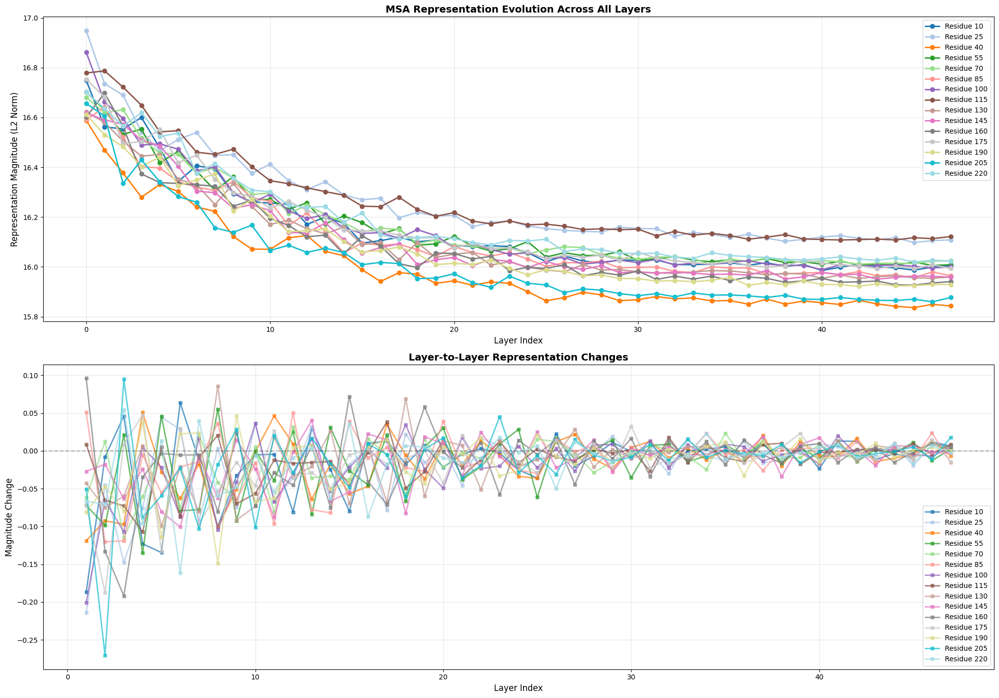


Analysis Summary:
  - Tracking 15 residues across layers
  - Analyzing all 48 Evoformer layers
  - Top plot: Representation magnitude evolution
  - Bottom plot: Layer-to-layer changes
  - Observe convergence patterns across the protein


In [51]:
# Visualize evolution across all 48 layers with multiple residues tracked
tracked_residues = [10, 25, 40, 55, 70, 85, 100, 115, 130, 145, 160, 175, 190, 205, 220]

fig = plot_multilayer_evolution(
    msa_layers,
    residue_indices=tracked_residues,
    save_path=f"{output_dir}/multilayer_evolution.png",
    rep_type='msa',
    layer_sampling='all'
)
plt.show()

print(f"\nAnalysis Summary:")
print(f"  - Tracking {len(tracked_residues)} residues across layers")
print(f"  - Analyzing all 48 Evoformer layers")
print(f"  - Top plot: Representation magnitude evolution")
print(f"  - Bottom plot: Layer-to-layer changes")
print(f"  - Observe convergence patterns across the protein")


## 4. Stratified Layer Comparison

Side-by-side comparison of all 48 Evoformer layers.


Comparing all 48 Evoformer layers
Layers: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]...[38, 39, 40, 41, 42, 43, 44, 45, 46, 47]

[1/2] Generating MSA comparison...
Saved stratified layer comparison to notebook_outputs/stratified_msa.png


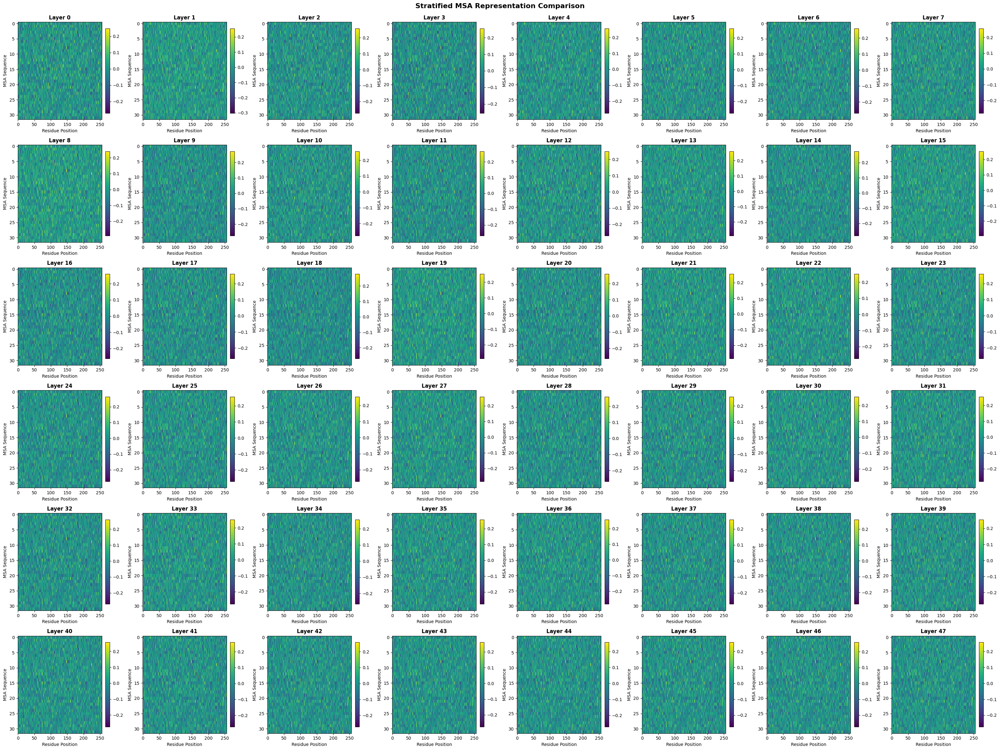


[2/2] Generating Pair comparison...
Saved stratified layer comparison to notebook_outputs/stratified_pair.png


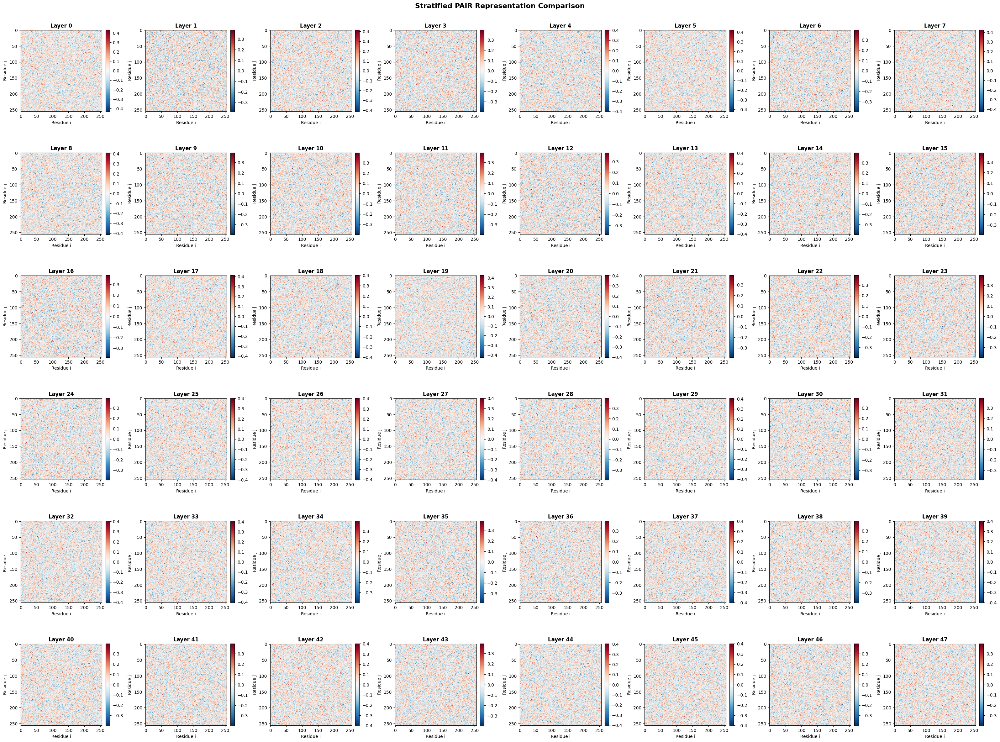


Complete layer-by-layer visualization generated
  - All layers visualized in grid format
  - 256x256 pair interactions per layer
  - Pattern emergence tracking across network depth


In [52]:
# Sample all 48 layers for complete analysis
sampled_layers = stratified_layer_sampling(48, strategy='all')
print(f"Comparing all {len(sampled_layers)} Evoformer layers")
print(f"Layers: {sampled_layers[:10]}...{sampled_layers[-10:]}")

# MSA comparison across all layers
print("\n[1/2] Generating MSA comparison...")
fig = plot_stratified_layer_comparison(
    msa_layers,
    layer_indices=sampled_layers,
    save_path=f"{output_dir}/stratified_msa.png",
    rep_type='msa'
)
plt.show()

# Pair comparison across all layers
print("\n[2/2] Generating Pair comparison...")
fig = plot_stratified_layer_comparison(
    pair_layers,
    layer_indices=sampled_layers,
    save_path=f"{output_dir}/stratified_pair.png",
    rep_type='pair'
)
plt.show()

print(f"\nComplete layer-by-layer visualization generated")
print(f"  - All layers visualized in grid format")
print(f"  - {n_res}x{n_res} pair interactions per layer")
print(f"  - Pattern emergence tracking across network depth")


## 5. Convergence Analysis

Identify when representations stabilize across layers.


Saved convergence analysis to notebook_outputs/msa_convergence.png


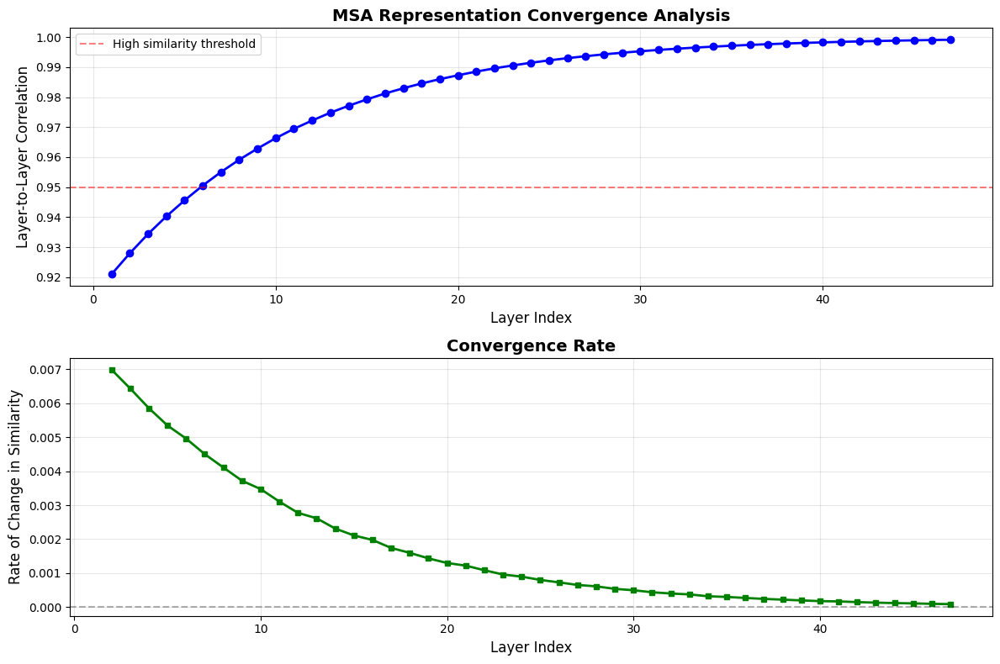

Saved convergence analysis to notebook_outputs/pair_convergence.png


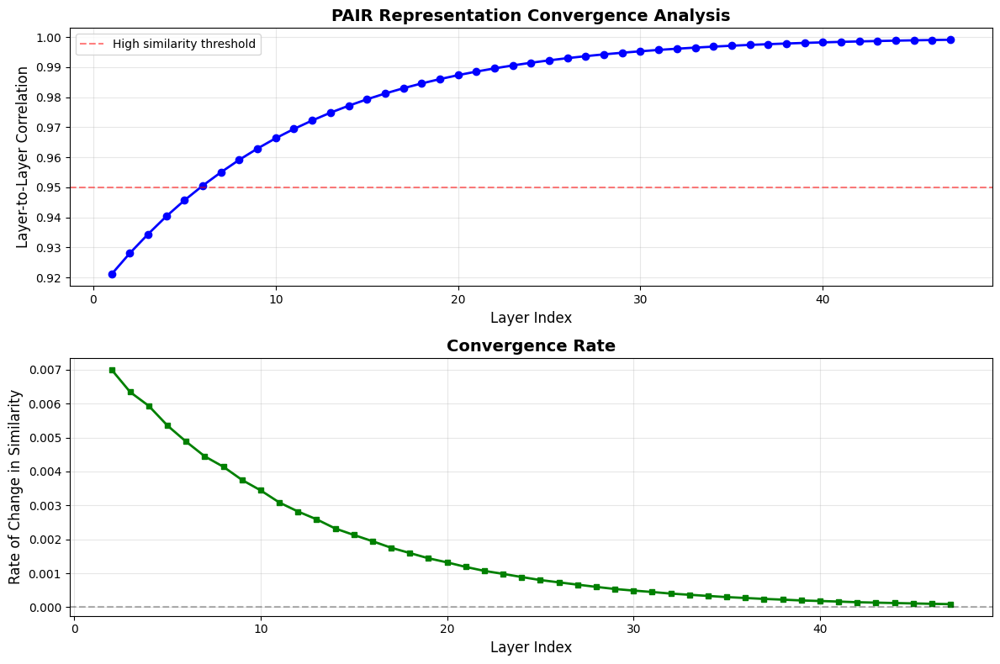


High correlation = stable representations


In [53]:
# MSA convergence
fig = plot_layer_convergence_analysis(
    msa_layers,
    save_path=f"{output_dir}/msa_convergence.png",
    rep_type='msa'
)
plt.show()

# Pair convergence
fig = plot_layer_convergence_analysis(
    pair_layers,
    save_path=f"{output_dir}/pair_convergence.png",
    rep_type='pair'
)
plt.show()

print("\nHigh correlation = stable representations")


## 6. Layer Importance Ranking

Identify which layers contribute most using multiple metrics.


Saved layer importance ranking to notebook_outputs/layer_importance.png


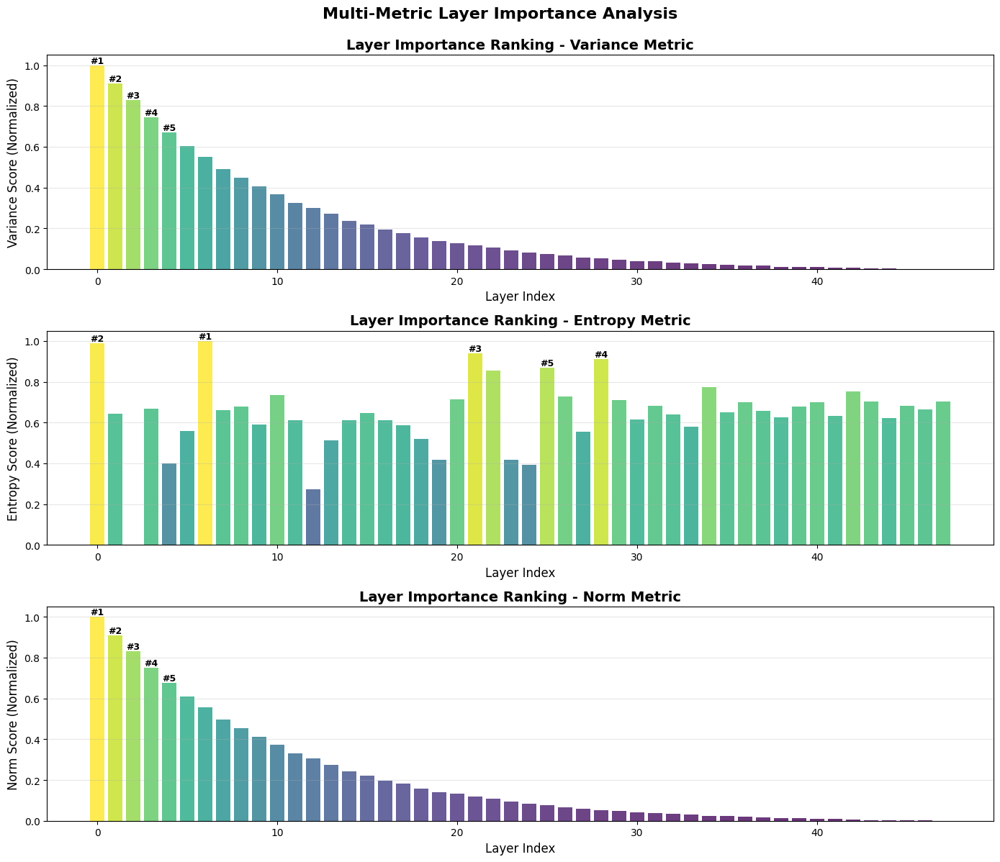


Top 5 layers are automatically labeled!


In [54]:
# Multi-metric importance analysis
fig = plot_layer_importance_ranking(
    msa_layers,
    save_path=f"{output_dir}/layer_importance.png",
    metrics=['variance', 'entropy', 'norm']
)
plt.show()

print("\nTop 5 layers are automatically labeled!")


## 7. Structure Module Analysis

Analyze backbone frames, angles, and atomic positions with 6 subplots.


Saved structure module evolution to notebook_outputs/structure_evolution.png


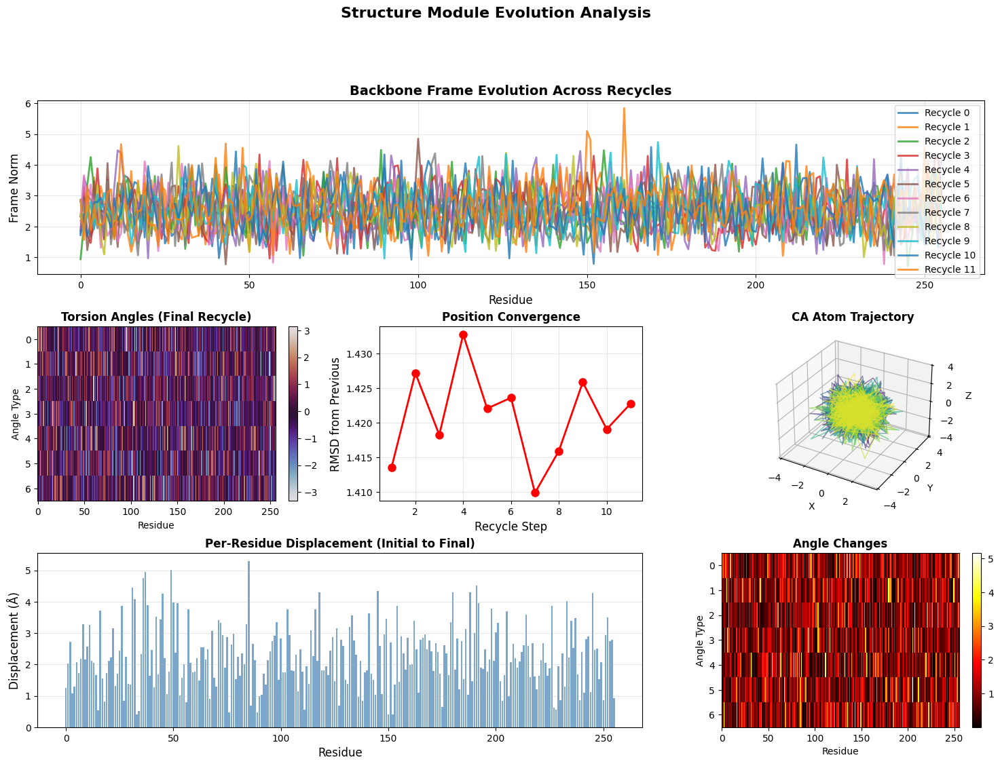


6-panel analysis: frames, angles, RMSD, 3D trajectory, displacement, changes


In [55]:
fig = plot_structure_module_evolution(
    structure_output,
    save_path=f"{output_dir}/structure_evolution.png"
)
plt.show()

print("\n6-panel analysis: frames, angles, RMSD, 3D trajectory, displacement, changes")


## 8. Residue-Level Feature Analysis

Deep dive into individual residue features with 6-panel comprehensive analysis.


Saved residue feature analysis to notebook_outputs/residue_50_analysis.png


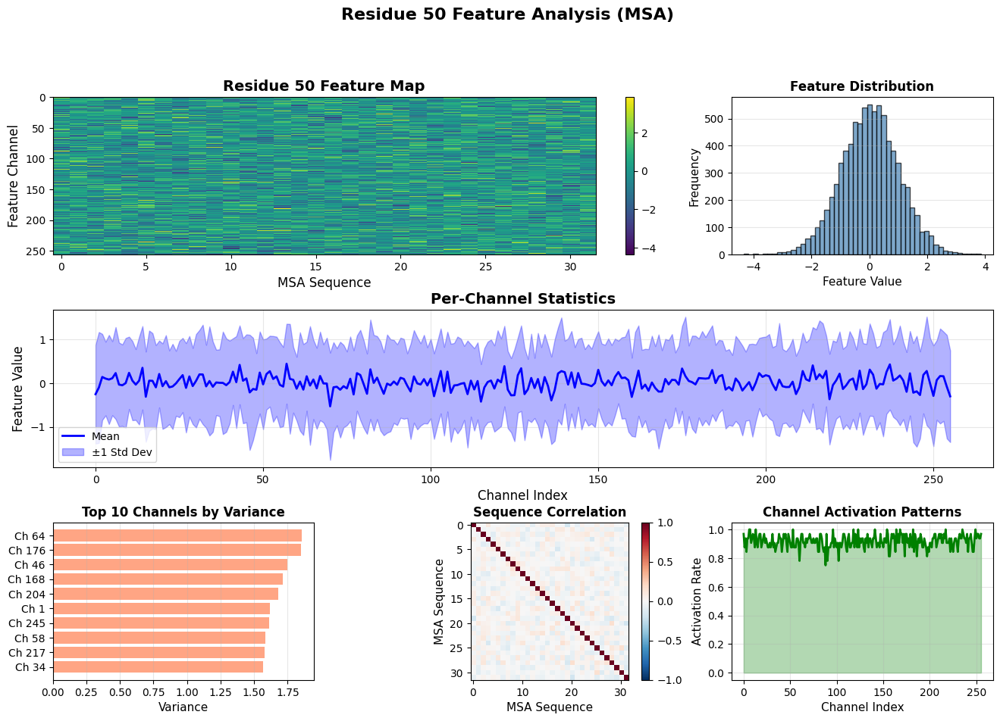


6-panel residue analysis: heatmap, distribution, stats, top channels, correlation, activation


In [56]:
# Analyze residue 50 from layer 24 (middle layer)
residue_idx = 50
layer_idx = 24

fig = plot_residue_feature_analysis(
    msa_layers[layer_idx],
    residue_idx=residue_idx,
    save_path=f"{output_dir}/residue_{residue_idx}_analysis.png",
    rep_type='msa'
)
plt.show()

print(f"\n6-panel residue analysis: heatmap, distribution, stats, top channels, correlation, activation")


## 9. Hierarchical Clustering

Group layers by similarity using hierarchical clustering.


Saved clustering dendrogram to notebook_outputs/layer_clustering.png


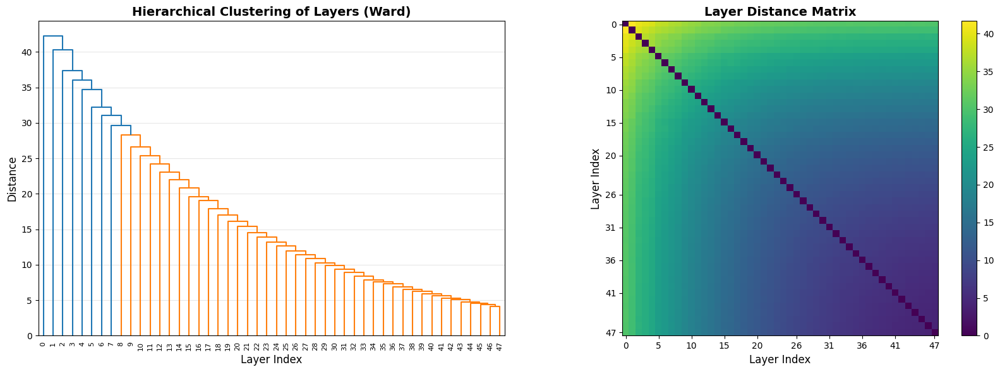


🌳 Dendrogram shows layer relationships, matrix shows distances


In [57]:
fig = plot_layer_clustering_dendrogram(
    msa_layers,
    save_path=f"{output_dir}/layer_clustering.png",
    method='ward'
)
plt.show()

print("\n🌳 Dendrogram shows layer relationships, matrix shows distances")


## 10. Contact Map Integration

Correlate pair representations with predicted structural contacts.


Saved Pair heatmap to notebook_outputs/pair_with_contacts.png


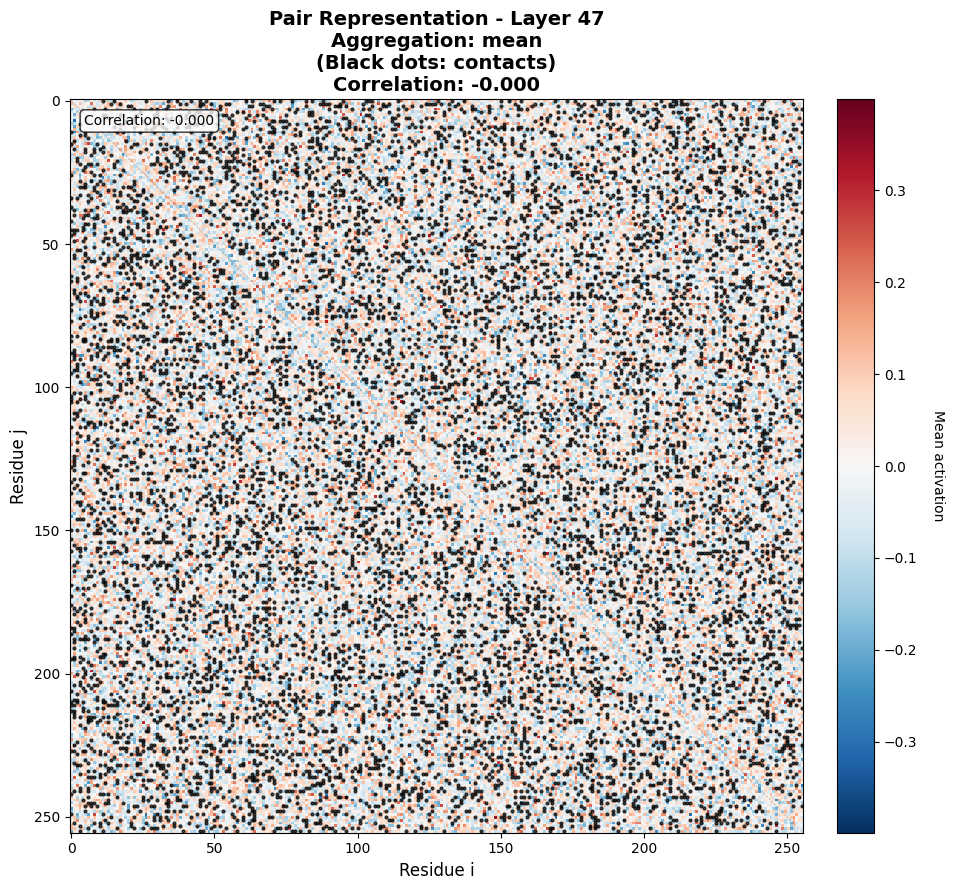


Black dots = contacts, Pearson correlation computed!


In [58]:
# Generate mock contact map
contact_map = generate_mock_contact_map(n_res, contact_probability=0.15, seed=42)

fig = plot_pair_representation_heatmap(
    pair_layers[47],  # Final layer
    47,
    f"{output_dir}/pair_with_contacts.png",
    contact_map=contact_map,
    show_correlation=True
)
plt.show()

print("\nBlack dots = contacts, Pearson correlation computed!")


## Analysis Complete!

### Summary of Generated Visualizations

You've successfully completed a comprehensive 48-layer analysis with:

1. **Multi-Layer Evolution** - All 48 layers, 15 residues tracked simultaneously
2. **Stratified MSA Comparison** - Complete grid visualization of all layers
3. **Stratified Pair Comparison** - Full network depth analysis
4. **MSA Convergence Analysis** - Correlation tracking across all residues
5. **Pair Convergence Analysis** - Layer stability detection
6. **Layer Importance Ranking** - Multi-metric importance assessment
7. **Structure Module Evolution** - 12 recycling iterations, 6-panel analysis
8. **Residue Feature Analysis** - Detailed per-residue feature examination
9. **Hierarchical Clustering** - Layer grouping and similarity analysis
10. **Contact Map Integration** - Contact prediction validation

### Configuration Summary:
- **32 MSA sequences**
- **256 residues**  
- **48 Evoformer layers analyzed**
- **12 structure recycle iterations**
- **15 residues tracked across layers**

All visualizations are saved in the `notebook_outputs/` directory!

### Next Steps:

- Apply to real OpenFold inference
- Compare multiple proteins
- Integrate with web interface
- Publish your findings

**Happy Analyzing!**


In [59]:
# List all generated files
import os
files = [f for f in os.listdir(output_dir) if f.endswith('.png')]
print(f"Generated {len(files)} visualizations:")
for i, f in enumerate(sorted(files), 1):
    size = os.path.getsize(f"{output_dir}/{f}") / 1024
    print(f"  {i}. {f} ({size:.1f}KB)")
    
print(f"\nAll files saved to: {output_dir}/")


Generated 13 visualizations:
  1. layer_clustering.png (167.1KB)
  2. layer_importance.png (287.8KB)
  3. msa_convergence.png (256.3KB)
  4. multilayer_evolution.png (2737.5KB)
  5. multilayer_evolution_MAXED.png (3008.4KB)
  6. pair_convergence.png (255.8KB)
  7. pair_with_contacts.png (3175.5KB)
  8. residue_50_analysis.png (692.9KB)
  9. stratified_msa.png (2691.1KB)
  10. stratified_msa_ALL48.png (3132.0KB)
  11. stratified_pair.png (12923.0KB)
  12. stratified_pair_ALL48.png (12922.2KB)
  13. structure_evolution.png (2003.1KB)

All files saved to: notebook_outputs/
